**Practical No 1 (Image Processing Lab)**

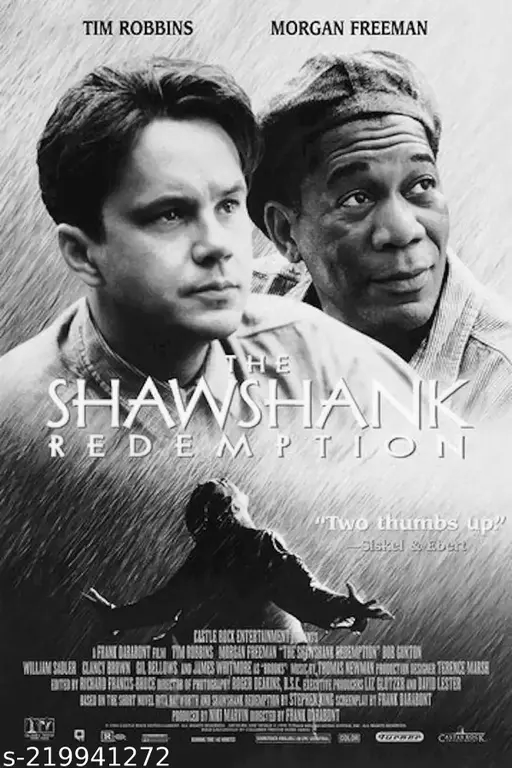

In [4]:
from IPython import get_ipython
from IPython.display import display

import cv2
from google.colab.patches import cv2_imshow


imgpath = ('/content/srdp.png')
image = cv2.imread(imgpath)
cv2.imread('Original', image)
# Use the cvtColor() function to grayscale the image
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray_image)

**Practical No.2**

In [5]:
# program 2 height, width, number of channels in image
import cv2
# Load the image
imgpath = ('/content/srdp.png')
image = cv2.imread(imgpath)
height = image.shape[0]
width = image.shape[1]
channels = image.shape[2]
size1 = image.size
dimensions=(height*width)
print('Image Dimension    : ',dimensions)
print('Image Height       : ',height)
print('Image Width        : ',width)
print('Number of Channels : ',channels)
print('Image Size  :', size1)


Image Dimension    :  393216
Image Height       :  768
Image Width        :  512
Number of Channels :  3
Image Size  : 1179648


**Practical No.3**

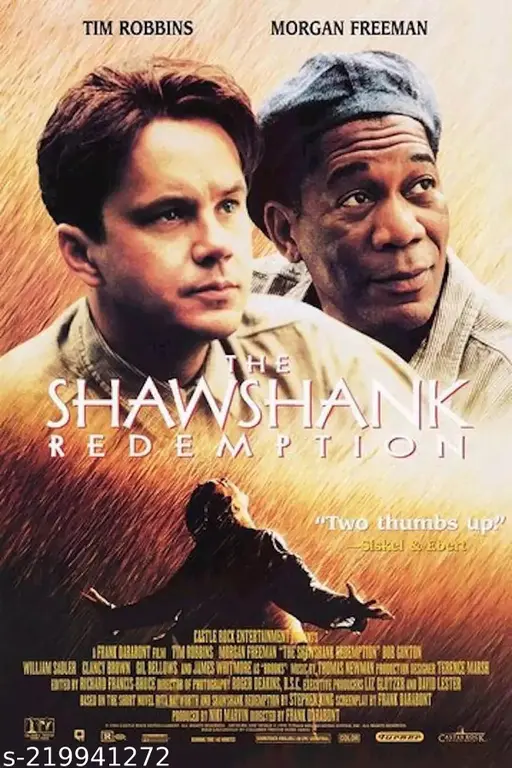

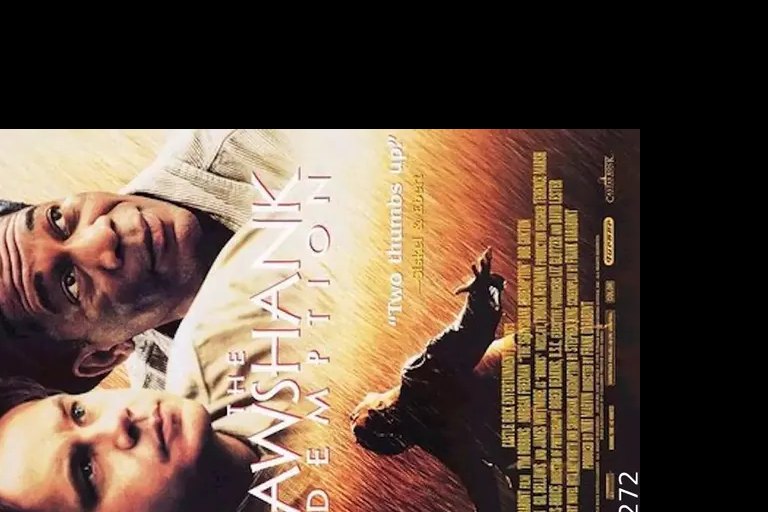

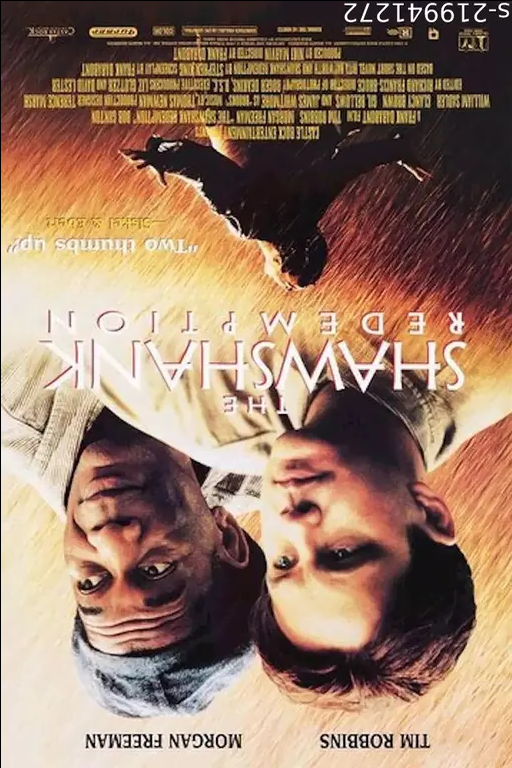

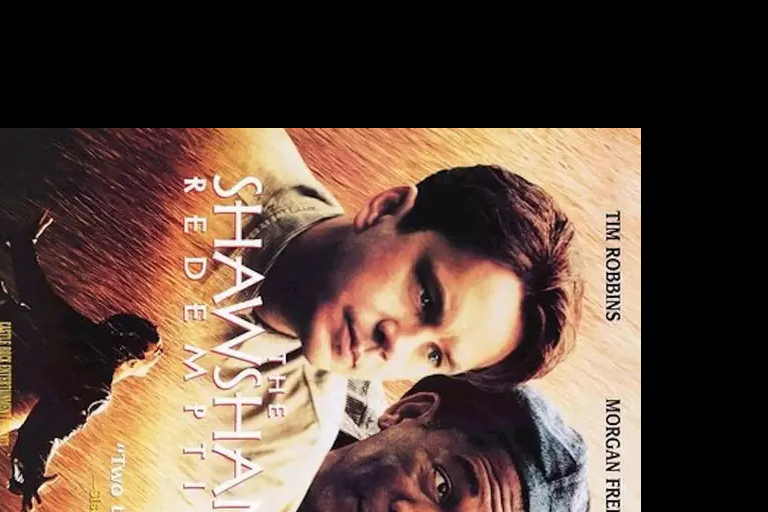

In [6]:

#Program 3 for rotate image

# Load the image
imgpath = ('/content/srdp.png')
image = cv2.imread(imgpath)

(h, w) = image.shape[:2]
# calculate the center of the image
center = (w / 2, h / 2)
angle90 = 90
angle180 = 180
angle270 = 270

scale = 1.0

# Perform the counterclockwise rotation holding at the center
# 90 degrees
M = cv2.getRotationMatrix2D(center, angle90, scale)
rotated90 = cv2.warpAffine(image, M, (h, w))

# 180 degrees
M = cv2.getRotationMatrix2D(center, angle180, scale)
rotated180 = cv2.warpAffine(image, M, (w, h))

# 270 degrees
M = cv2.getRotationMatrix2D(center, angle270, scale)
rotated270 = cv2.warpAffine(image, M, (h, w))

cv2_imshow(image)


cv2_imshow(rotated90)


cv2_imshow(rotated180)


cv2_imshow(rotated270)




**Practical No.4 Image Processing Lab**

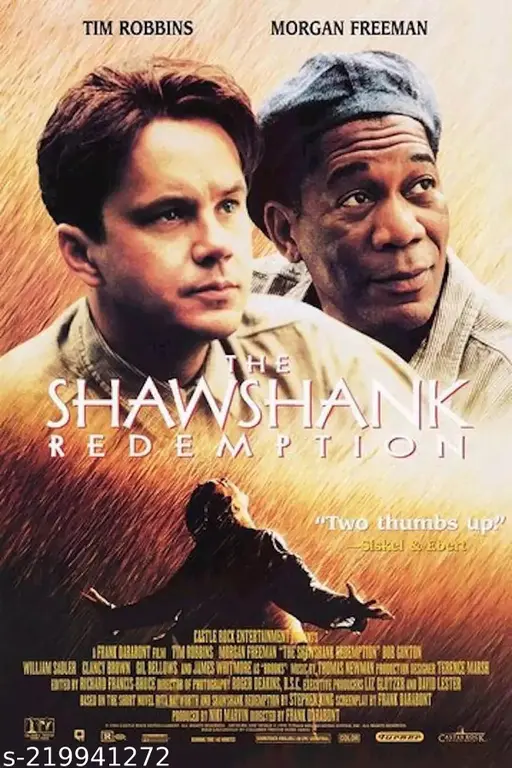

Resized Dimensions :  (1152, 768, 3)


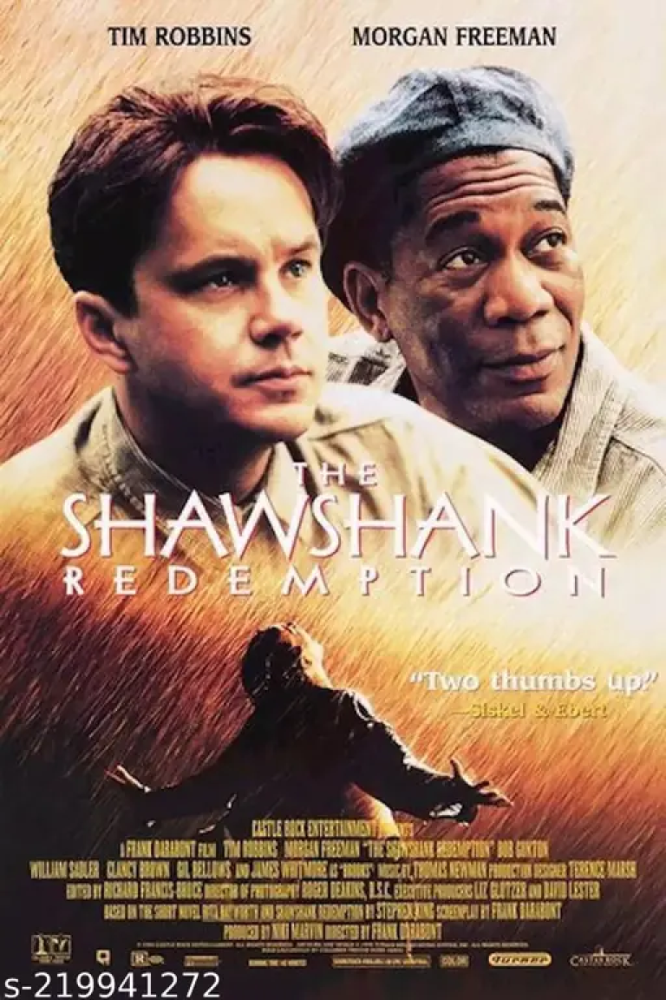

Resized Image:


In [4]:
imgpath = ('/content/srdp.png')
image = cv2.imread(imgpath)
cv2_imshow(image)  # Changed line: Pass only the image to cv2_imshow()
scale = 150
width = int(image.shape[1] * scale / 100)
height = int(image.shape[0] * scale / 100)
dim = (width, height)

resized = cv2.resize(image, dim, interpolation=cv2.INTER_AREA)

print('Resized Dimensions : ', resized.shape)

cv2_imshow(resized)
print("Resized Image:")

**Practical No 5 Image Processing lab**

pixel value at [200,150]: [101 132 202]
pixel value blue channel at [200,150]: 101
pixel value green channel at [200,150]: 132
pixel value red channel at[200,150]: 202
after modifying pixel value at [200,150]: [  0   0 255]


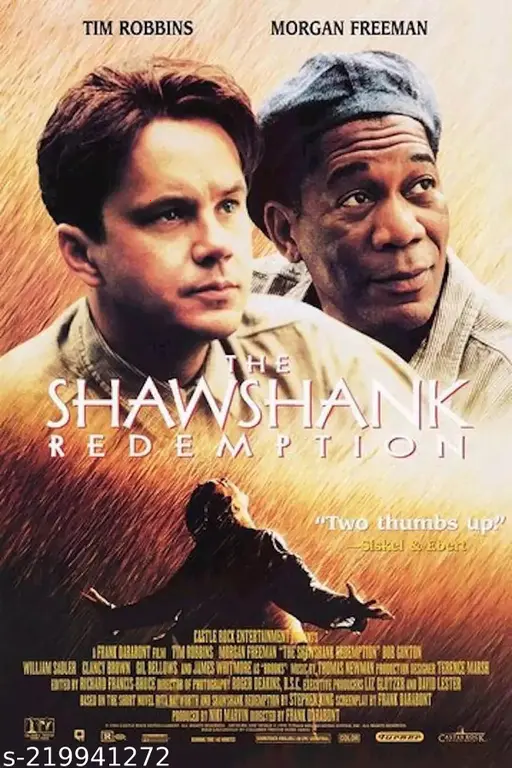

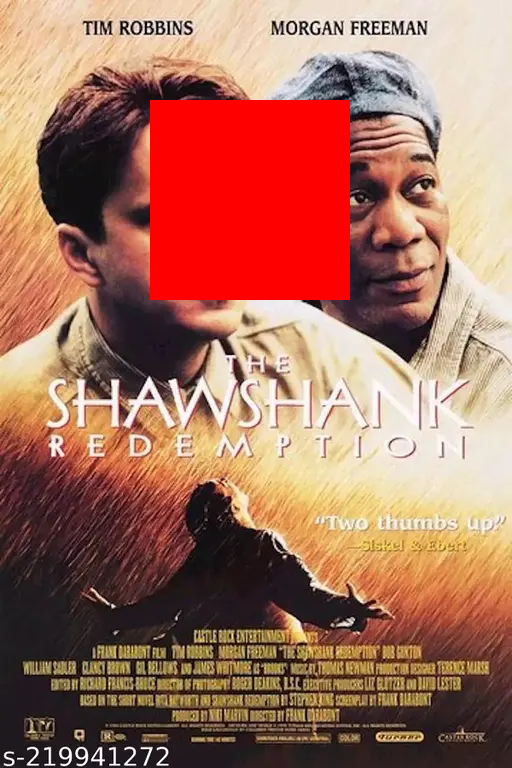

In [8]:
import cv2
import matplotlib.pyplot as plt
img = cv2.imread('/content/srdp.png')
print("pixel value at [200,150]:", img[200,150])
print("pixel value blue channel at [200,150]:", img[200,150][0])
print("pixel value green channel at [200,150]:", img[200,150][1])
print("pixel value red channel at[200,150]:", img[200,150][2])
img[200,150] = (0, 0, 255)
print("after modifying pixel value at [200,150]:", img[200,150])
cv2_imshow(img)
img[100:300,150:350] = (0, 0, 255)
cv2_imshow(img)



**Lab 5 Image Processing Lab**

Original Image:


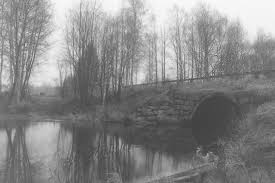

Contrast Stretched Image:


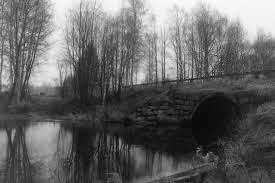

Original Histogram:


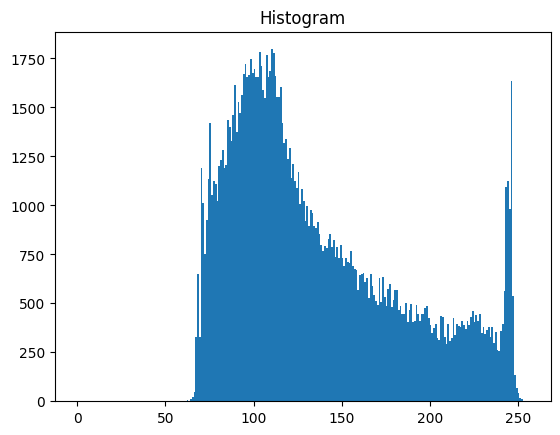

Contrast Stretched Histogram:


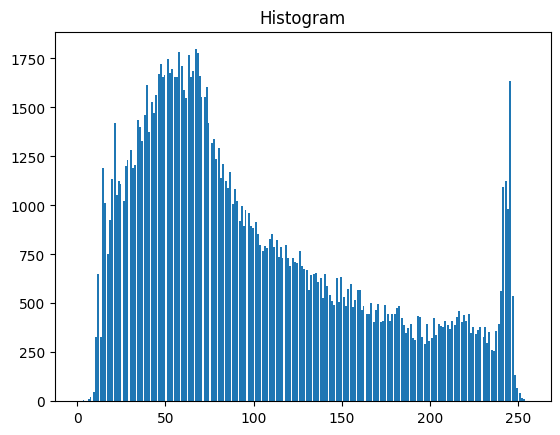

Histogram Equalized Image:


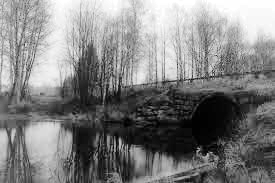

Equalized Histogram:


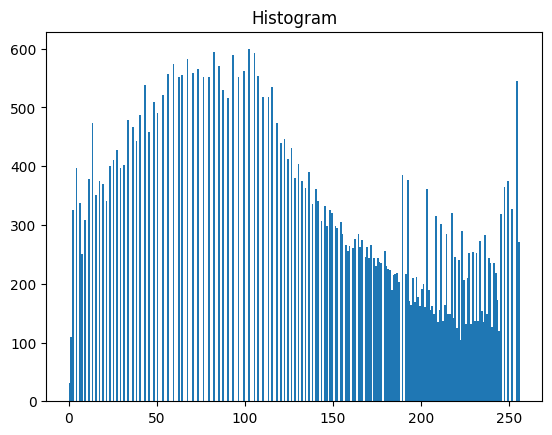

In [19]:
import cv2
import matplotlib.pyplot as plt
import numpy as np # Added import for numpy

image=img = cv2.imread('/content/LowcontrastDIP.jpeg')

def contrast_stretching(image):
    a, b = 0, 255
    c, d = np.min(image), np.max(image)
    stretched = ((image - c) * ((b - a) / (d - c))) + a
    return stretched.astype(np.uint8)

# 2. Histogram
def display_histogram(image):
    plt.hist(image.ravel(), 256, [0, 256])
    plt.title("Histogram")
    plt.show()

def histogram_equalization(image):
    gray_image= cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    equalized = cv2.equalizeHist(gray_image)
    return equalized

# Removed unexpected indentation and added calling code outside function definitions
stretched = contrast_stretching(image)
print("Original Image:")
cv2_imshow(image)
print("Contrast Stretched Image:")
cv2_imshow(stretched)

# 2. Histogram
print("Original Histogram:")
display_histogram(image)
print("Contrast Stretched Histogram:")
display_histogram(stretched)

# 3. Histogram Equalization
equalized = histogram_equalization(image)
print("Histogram Equalized Image:")
cv2_imshow(equalized)
print("Equalized Histogram:")
display_histogram(equalized)

**Lab 6 Image Processing Lab**

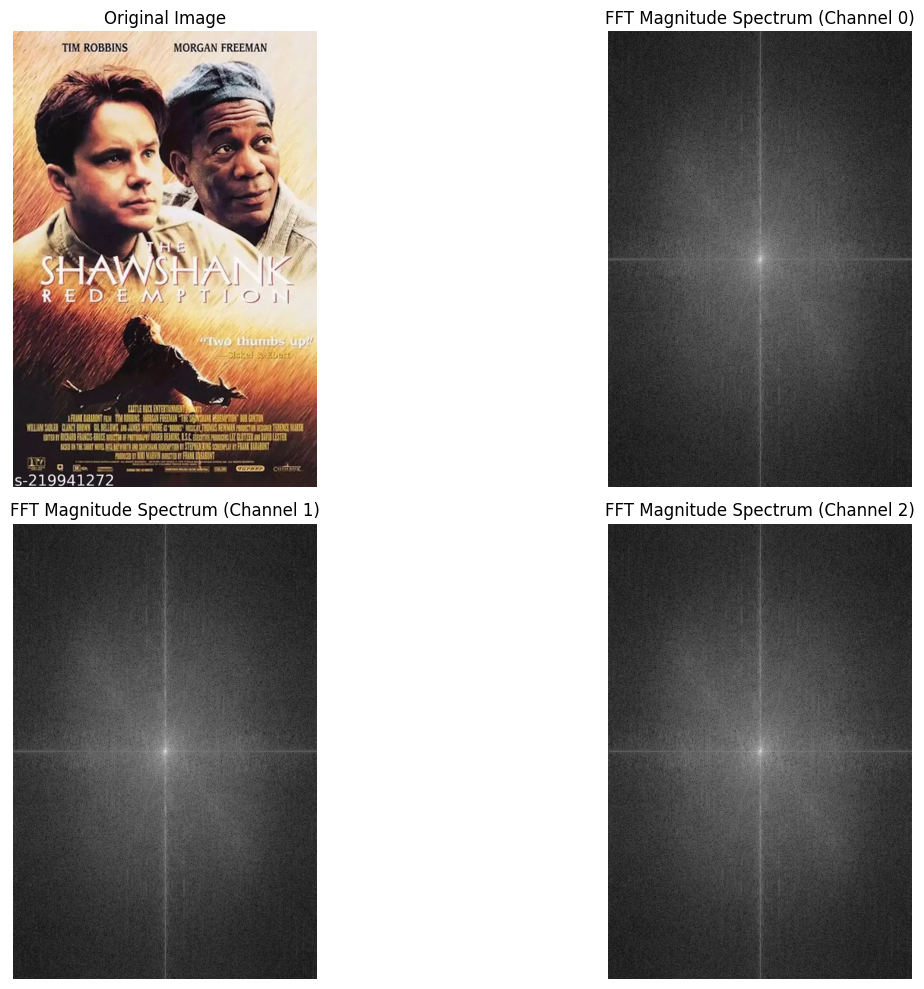

In [26]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fftpack import fft, fftshift, fft2, fftfreq
from skimage import io, color

# Step 1: Load and preprocess the image
image_url = '/content/srdp.png'  # Example image
image = io.imread(image_url)

# If the image is grayscale, convert it to RGB for processing
if image.ndim == 2:
    image = color.gray2rgb(image)

# Normalize the image (optional but recommended)
image = image / 255.0

# Step 2 & 3: Compute FFT for each color channel separately
fft_channels = []
for channel in range(3): # Iterate through R, G, B channels
    fft_2d = fft2(image[:, :, channel])  # 2D FFT for each channel
    fft_2d_shifted = fftshift(fft_2d)
    fft_channels.append(np.log(np.abs(fft_2d_shifted) + 1))

# Step 4: Visualization
plt.figure(figsize=(15, 10))

# Original image
plt.subplot(2, 2, 1)
plt.title("Original Image")
plt.imshow(image)  # Display the original color image
plt.axis('off')

# Display FFT magnitude spectrum for each channel
for i, channel_fft in enumerate(fft_channels):
    plt.subplot(2, 2, i + 2)
    plt.title(f"FFT Magnitude Spectrum (Channel {i})")
    plt.imshow(channel_fft, cmap='gray')  # Or 'viridis', 'jet', etc.
    plt.axis('off')

plt.tight_layout()
plt.show()

**Lab 6 Practical**

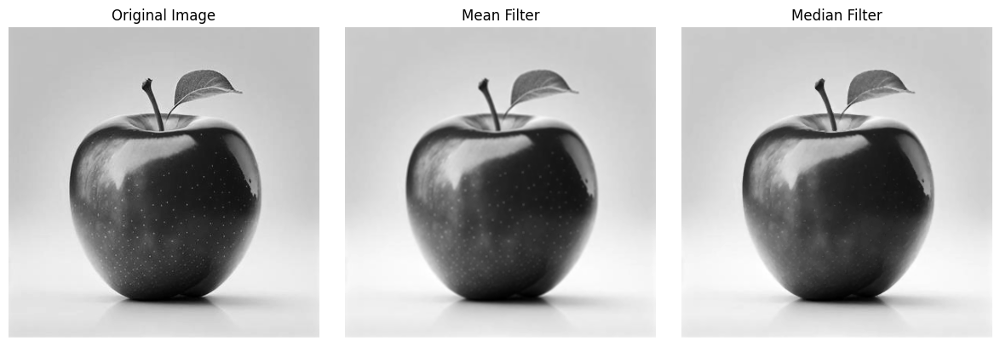

In [31]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import uniform_filter, median_filter
from skimage import io, color

# Load the image
image = io.imread('/content/DIP image.jpg')
if image.ndim == 3:  # Convert to grayscale if it's a color image
    image = color.rgb2gray(image)

# Apply filters
mean_filtered = uniform_filter(image, size=3)
median_filtered = median_filter(image, size=3)

# Display results
plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.title("Original Image")
plt.imshow(image, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title("Mean Filter")
plt.imshow(mean_filtered, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title("Median Filter")
plt.imshow(median_filtered, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()


**Lab 7 Image Processing**

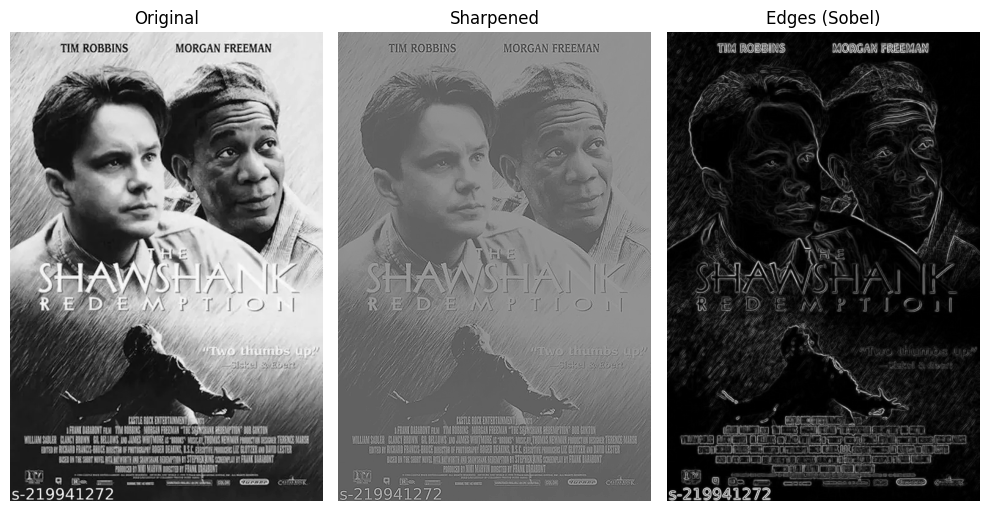

In [32]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, filters
from scipy.ndimage import convolve

# Load and preprocess image
image = io.imread('/content/srdp.png')
if image.ndim == 3:  # Convert to grayscale
    image = color.rgb2gray(image)

# Sharpening kernel
sharpen_kernel = np.array([[0, -1, 0],
                            [-1, 5, -1],
                            [0, -1, 0]])
sharpened = convolve(image, sharpen_kernel)

# Sobel filters
sobel_x = filters.sobel_h(image)
sobel_y = filters.sobel_v(image)

# Plot results
plt.figure(figsize=(10, 5))

plt.subplot(1, 3, 1)
plt.title("Original")
plt.imshow(image, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title("Sharpened")
plt.imshow(sharpened, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title("Edges (Sobel)")
plt.imshow(np.sqrt(sobel_x**2 + sobel_y**2), cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

**Lab 8 Assignment Image Processing**

<ipython-input-42-919321594b40>:47: RuntimeWarning: overflow encountered in scalar subtract
  compressed_image[i,j]=image[i,j]-image[i-1,j]-image[i,j-1]+image[i-1,j-1]
<ipython-input-42-919321594b40>:47: RuntimeWarning: overflow encountered in scalar add
  compressed_image[i,j]=image[i,j]-image[i-1,j]-image[i,j-1]+image[i-1,j-1]


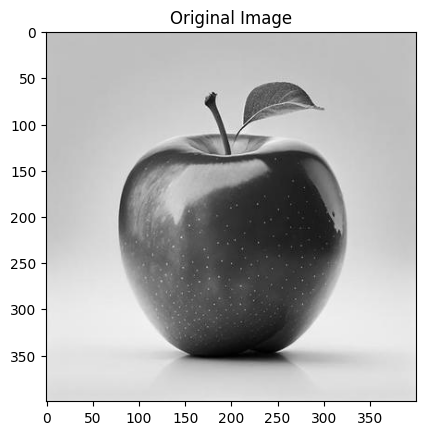

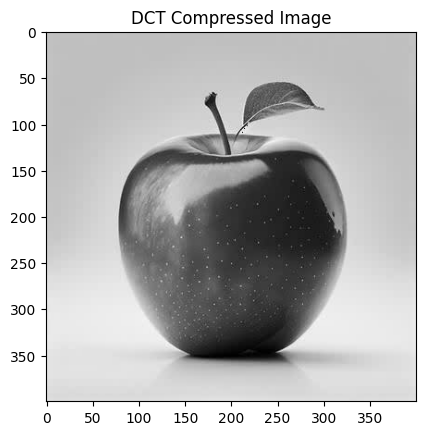

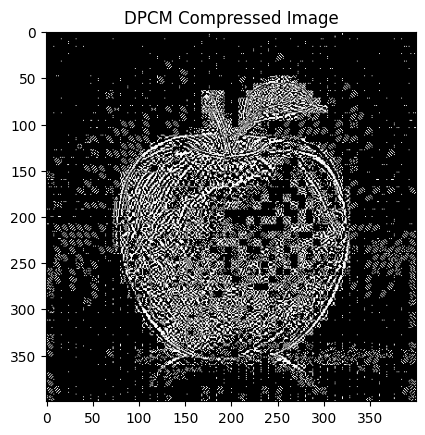

Huffman Codes:
254:


In [42]:
import cv2
import numpy as np
import heapq
import matplotlib.pyplot as plt

def show_image(title,img, is_gray=False):
  plt.figure()
  plt.title(title)
  if is_gray:
    plt.imshow(img, cmap='gray')
  else:
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
  plt.show()


image=cv2.imread('/content/DIP image.jpg',cv2.IMREAD_GRAYSCALE)

if image is None:
  print("Image not found")
  exit()

def dct_compression(image, block_size=8, threshold=10):
    height, width = image.shape
    dct_coeffs = np.zeros_like(image, dtype=np.float32)
    compressed_image = np.zeros_like(image, dtype=np.float32)  # Initialize compressed_image

    for i in range(0, height, block_size):
        for j in range(0, width, block_size):
            block = image[i:i + block_size, j:j + block_size]  # Removed extra comma
            dct_block = cv2.dct(np.float32(block))

            dct_block[np.abs(dct_block) < threshold] = 0  # Changed dct.block to dct_block

            compressed_image[i:i + block_size, j:j + block_size] = cv2.idct(dct_block)

    return np.uint8(compressed_image)

compressed_dct_image=dct_compression(image)

def dpcm_compression(image):
  height,width=image.shape
  # Change dtype to np.uint8:
  compressed_image=np.zeros_like(image,dtype=np.uint8)

  for i in range(1,height): # Changed i to 1 to avoid accessing index -1
    for j in range(1,width): # Changed j to 1 to avoid accessing index -1
        compressed_image[i,j]=image[i,j]-image[i-1,j]-image[i,j-1]+image[i-1,j-1]
  return compressed_image


compressed_dct_image=dct_compression(image)
compressed_dpcm_image = dpcm_compression(image)


def create_huffman_tree(data):
  frequency={}

  for pixel in data:
    if pixel in frequency:
      frequency[pixel]+=1
    else:
      frequency[pixel]=1

  priority_queue=[[weight,[symbol,""]]for symbol,weight in frequency.items()]
  heapq.heapify(priority_queue)

  while len(priority_queue)>1:
    lo=heapq.heappop(priority_queue)
    hi=heapq.heappop(priority_queue)

    for pair in lo[1:]:
      pair[1]='0' + pair[1]
    for pair in hi[1:]:
      pair[1]='1' + pair[1]

      heapq.heappush(priority_queue,[lo[0]+hi[0]]+lo[1:]+hi[1:])


    huffman_codes={}
    for pair in priority_queue[0][1:]:
      huffman_codes[pair[0]]=pair[1]

    return huffman_codes

image_flattened=image.flatten()
huffman_codes=create_huffman_tree(image_flattened)

show_image("Original Image",image)
show_image("DCT Compressed Image",compressed_dct_image)
show_image("DPCM Compressed Image",compressed_dpcm_image)

print("Huffman Codes:")
for symbol,code in huffman_codes.items():
  print(f"{symbol}:{code}")

**Lab 9 Assignment Image Processing**

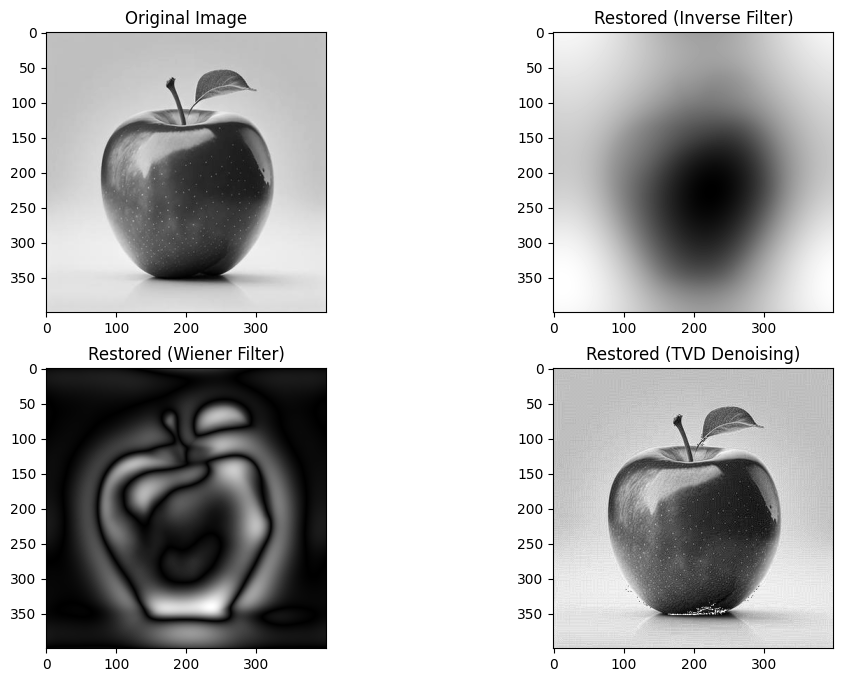

In [60]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from scipy.signal import convolve2d

# Function for Inverse Filtering
def inverse_filter(image, kernel):
    f_image = np.fft.fft2(image)
    f_kernel = np.fft.fft2(kernel, s=image.shape)

    # Avoid division by zero in the frequency domain
    f_restored = f_image / (f_kernel + 1e-10)
    restored_image = np.abs(np.fft.ifft2(f_restored))
    return restored_image

# Function for Wiener Filtering
def wiener_filter(image, kernel, noise_var, image_var):
    kernel_ft = np.fft.fft2(kernel, s=image.shape)
    image_ft = np.fft.fft2(image)

    # Wiener filter formula
    H_conj = np.conj(kernel_ft)
    G = (H_conj * image_ft) / (np.abs(kernel_ft)**2 + noise_var / image_var)

    restored_image = np.abs(np.fft.ifft2(G))
    return restored_image

# Function for Total Variation Denoising
def tvd_denoising(image, weight=0.1, max_iter=100):
    u = image.astype(np.float32) # Change to float32 or float64
    for _ in range(max_iter):
        grad_u_x = np.roll(u, -1, axis=1) - u
        grad_u_y = np.roll(u, -1, axis=0) - u
        grad_u_x[:, -1] = 0
        grad_u_y[-1, :] = 0

        norm_grad_u = np.sqrt(grad_u_x**2 + grad_u_y**2)
        norm_grad_u = np.maximum(norm_grad_u, 1e-10)

        u -= weight * (grad_u_x / norm_grad_u + grad_u_y / norm_grad_u)

    return u.astype(np.uint8)

# Main Code for Image Restoration
def restore_image(image_path, kernel, noise_var=0.1, image_var=None):
    # Read the image (grayscale)
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # If image variance is not provided, estimate it
    if image is None:
      print(f"Error: Could not load image from {image_path}")
      return

    if image_var is None:
        image_var = np.var(image)

    # Inverse Filtering
    restored_inverse = inverse_filter(image, kernel)

    # Wiener Filtering
    restored_wiener = wiener_filter(image, kernel, noise_var, image_var)

    # Total Variation Denoising
    restored_tvd = tvd_denoising(image)

    # Plot all results
    plt.figure(figsize=(12, 8))

    plt.subplot(2, 2, 1)
    plt.imshow(image, cmap='gray')
    plt.title("Original Image")

    plt.subplot(2, 2, 2)
    plt.imshow(restored_inverse, cmap='gray')
    plt.title("Restored (Inverse Filter)")

    plt.subplot(2, 2, 3)
    plt.imshow(restored_wiener, cmap='gray')
    plt.title("Restored (Wiener Filter)")

    plt.subplot(2, 2, 4)
    plt.imshow(restored_tvd, cmap='gray')
    plt.title("Restored (TVD Denoising)")

    plt.show()

# Example kernel (motion blur or another degradation kernel)
kernel = np.array([[0, -1, 0], [-1, 4, -1], [0, -1, 0]])

# Image path (example)
image_path = '/content/DIP image.jpg'

# Perform restoration
restore_image(image_path, kernel)


**Lab 10 Assignment Image processing**

Saving DIP image.jpg to DIP image (1).jpg


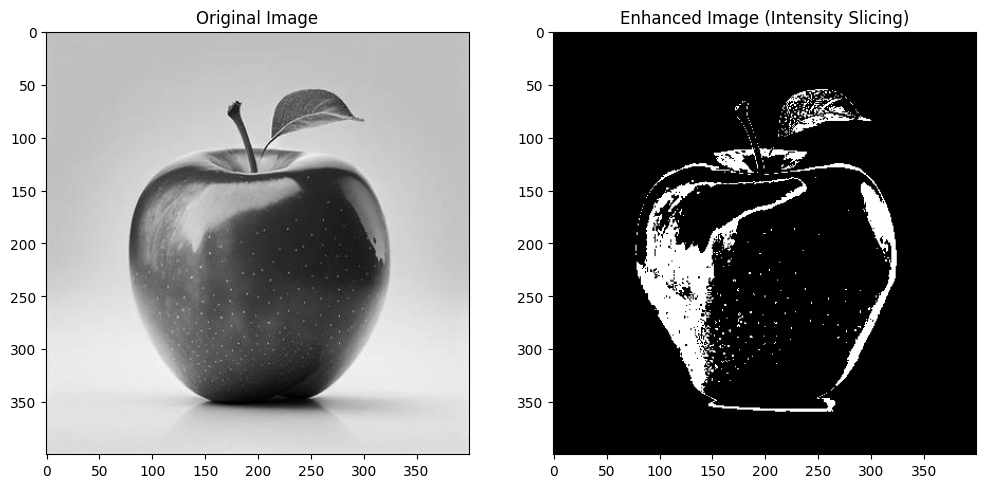

In [61]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab import files

# Function for Intensity Slicing
def intensity_slicing(image, lower_bound, upper_bound, new_value=255):
    """
    Enhance the intensity range between lower_bound and upper_bound by setting them to new_value.
    All pixels outside the range are set to 0 (black).
    """
    # Create a copy of the original image to avoid modifying the input directly
    enhanced_image = np.zeros_like(image)

    # Enhance pixels within the specified intensity range
    enhanced_image[(image >= lower_bound) & (image <= upper_bound)] = new_value

    return enhanced_image

# Main function to apply intensity slicing
def apply_intensity_slicing(image_path, lower_bound, upper_bound, new_value=255):
    # Read the image in grayscale
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Apply intensity slicing
    enhanced_image = intensity_slicing(image, lower_bound, upper_bound, new_value)

    # Plot original and enhanced image side by side
    plt.figure(figsize=(12, 6))

    # Original image
    plt.subplot(1, 2, 1)
    plt.imshow(image, cmap='gray')
    plt.title("Original Image")

    # Enhanced image after intensity slicing
    plt.subplot(1, 2, 2)
    plt.imshow(enhanced_image, cmap='gray')
    plt.title("Enhanced Image (Intensity Slicing)")

    plt.show()

# Upload image file in Google Colab
uploaded = files.upload()

# Get the uploaded file name (assuming a single image upload)
image_path = next(iter(uploaded))

# Example intensity range for slicing
lower_bound = 100  # Lower intensity bound for enhancement
upper_bound = 150  # Upper intensity bound for enhancement
new_value = 255     # New value to assign to the selected intensity range

# Apply intensity slicing on the uploaded image
apply_intensity_slicing(image_path, lower_bound, upper_bound, new_value)


**Lab 11 Assignment Image Processing lab**

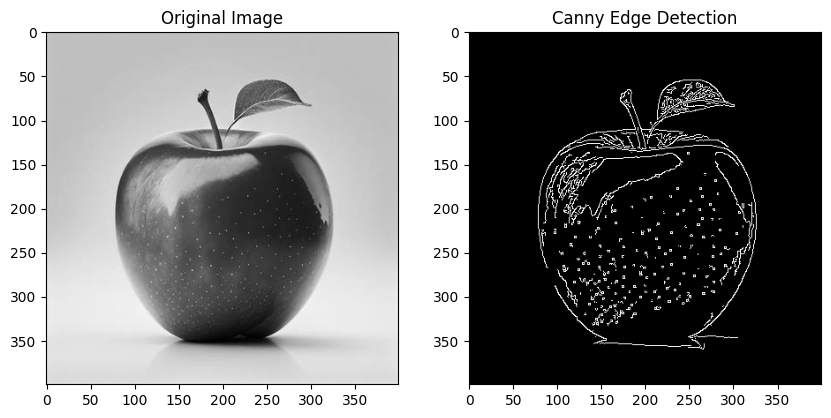

In [62]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to perform Canny Edge Detection
def canny_edge_detection(image_path, low_threshold, high_threshold):
    # Read the image
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Perform Canny edge detection
    edges = cv2.Canny(image, low_threshold, high_threshold)

    # Display the original and edge-detected image
    plt.figure(figsize=(10, 5))

    # Original image
    plt.subplot(1, 2, 1)
    plt.imshow(image, cmap='gray')
    plt.title("Original Image")

    # Edge-detected image
    plt.subplot(1, 2, 2)
    plt.imshow(edges, cmap='gray')
    plt.title("Canny Edge Detection")

    plt.show()

# Example usage
image_path = '/content/DIP image.jpg'  # Replace with your image path
low_threshold = 50  # Lower threshold for Canny
high_threshold = 150  # Upper threshold for Canny

# Apply Canny edge detection
canny_edge_detection(image_path, low_threshold, high_threshold)
